# Сверточные нейронные сети

# Предварительно тренированная YOLOv5

Примеры детекции и трекинга объектов на видео с проекцией на карту

Красная площадь
https://www.youtube.com/watch?v=zTyXf2ZaYHg

Япония
https://www.youtube.com/watch?v=2WthtjENaps

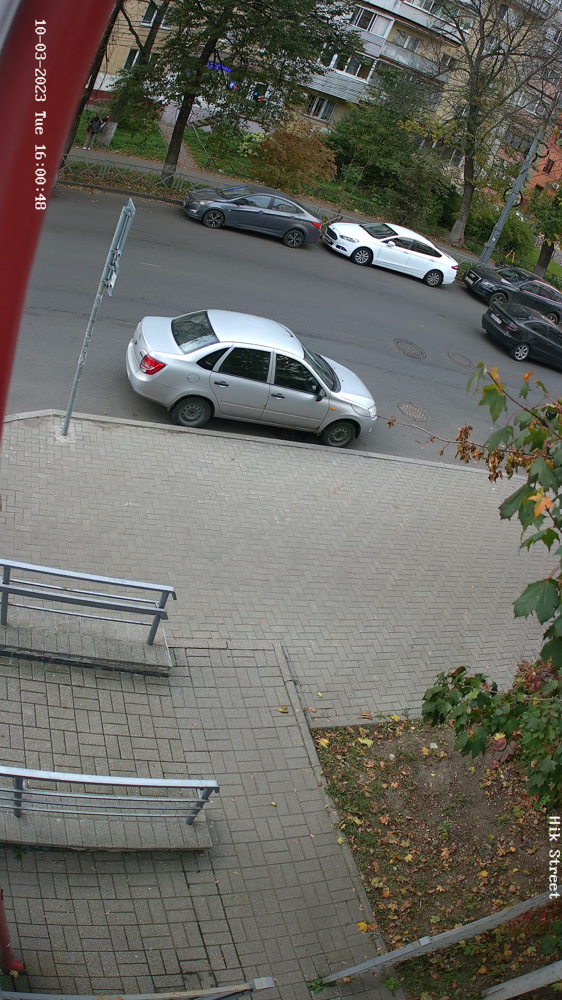

In [9]:
#1
import cv2 
from PIL import Image
import numpy as np

frame = cv2.imread('test.jpg')

frame2 = cv2.rotate(frame, cv2.ROTATE_90_CLOCKWISE)
frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB)
Image.fromarray(frame2)

In [18]:
#2
!pip install ultralytics --user


[notice] A new release of pip available: 22.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


После установки пакета может потребоваться restart kernel

In [6]:
#3
import torch
from ultralytics import YOLO
def load_model():
        device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
        model = torch.hub.load('ultralytics/yolov5', 'custom', path="./miobest28.pt")  # изменить путь к весам #miobest28.pt miomont64.pt
        print(f"Torch cuda: {torch.cuda.is_available()}")
        return model
model = load_model()

Using cache found in /home/dglyzin/.cache/torch/hub/ultralytics_yolov5_master


TypeError: custom() got an unexpected keyword argument 'map_location'

In [11]:
#4
width = 2160 # 3840
height = 3840 # 2160
scale_percent = 25
width_out = int(width * scale_percent / 100)
height_out = int(height * scale_percent / 100)
"""
preds = model(frame2)
detections = preds.pred[0].cpu().numpy()
print(detections)
for detection in detections:
    if detection[4] > 0.7:
        x1,y1,x2,y2=round(detection[0]), round(detection[1]), round(detection[2]), round(detection[3])
        cv2.line(frame2, (x1,y1), (x2,y1), (255, 0, 0), 2)
        cv2.line(frame2, (x2,y1), (x2,y2), (255, 0, 0), 2)
        cv2.line(frame2, (x2,y2), (x1,y2), (255, 0, 0), 2)
        cv2.line(frame2, (x1,y2), (x1,y1), (255, 0, 0), 2)
Image.fromarray(frame2) """    

'\npreds = model(frame2)\ndetections = preds.pred[0].cpu().numpy()\nprint(detections)\nfor detection in detections:\n    if detection[4] > 0.7:\n        x1,y1,x2,y2=round(detection[0]), round(detection[1]), round(detection[2]), round(detection[3])\n        cv2.line(frame2, (x1,y1), (x2,y1), (255, 0, 0), 2)\n        cv2.line(frame2, (x2,y1), (x2,y2), (255, 0, 0), 2)\n        cv2.line(frame2, (x2,y2), (x1,y2), (255, 0, 0), 2)\n        cv2.line(frame2, (x1,y2), (x1,y1), (255, 0, 0), 2)\nImage.fromarray(frame2) '

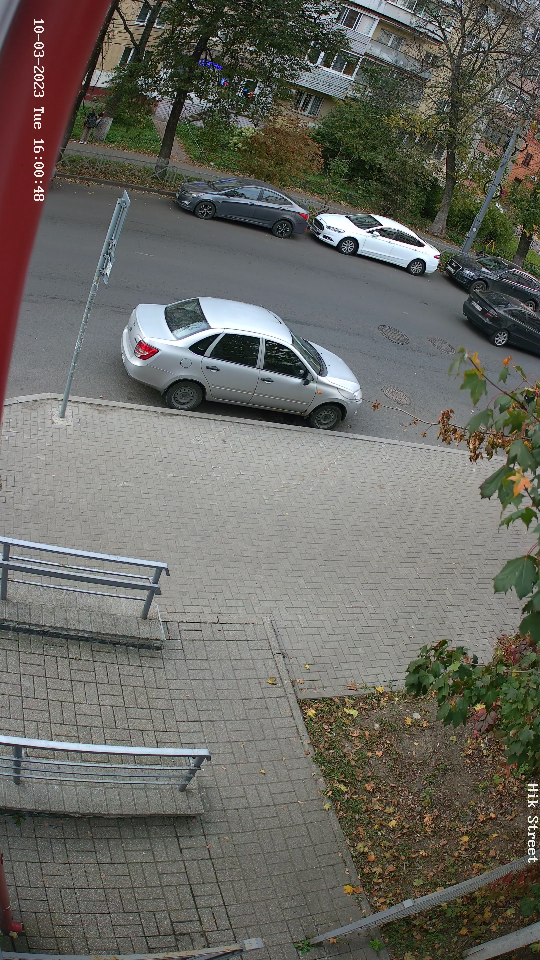

In [12]:
#5
frame3 = cv2.resize(frame2, (width_out, height_out))
Image.fromarray(frame3) 

Упражнение: напишите функцию уменьшения изображения в 2 раза по каждой оси, заменяя каждый блок из 4 точек максимальной интенсивностью среди них

In [32]:
print(frame2.shape)
print(frame2.shape[0]//2, frame2.shape[1]//2)
np.sum(frame2[0,0])

(3840, 2160, 3)
1920 1080


422

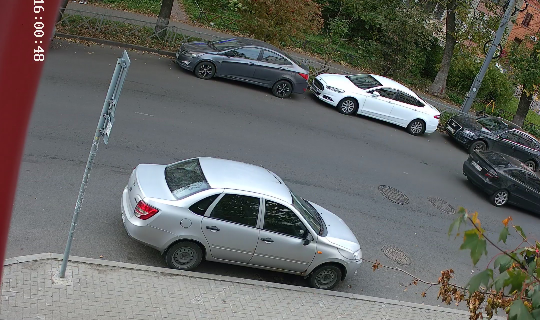

In [14]:
#6
frame4 = frame3[140:460, :] # 400
Image.fromarray(frame4) 

Упражнение: попробуйте частично закрасить одну из машин на рисунке (возьмите координаты детекции и заполните часть прямоугольника сплошным цветом) и снова проведите детекцию. Насколько чувствительна YOLO к потере части машины на изображении?

# Свертки (фильтрация)

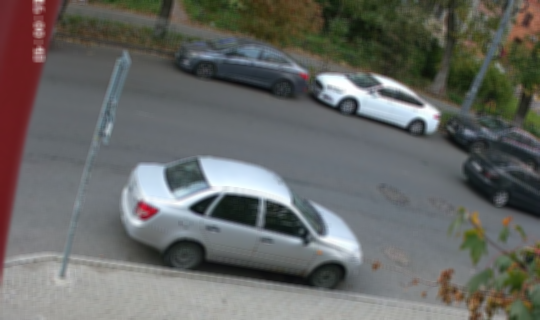

In [15]:
#7
boxblurkernel = np.ones((5,5),np.float32)/25
dst = cv2.filter2D(frame4,-1,boxblurkernel)
Image.fromarray(dst) 

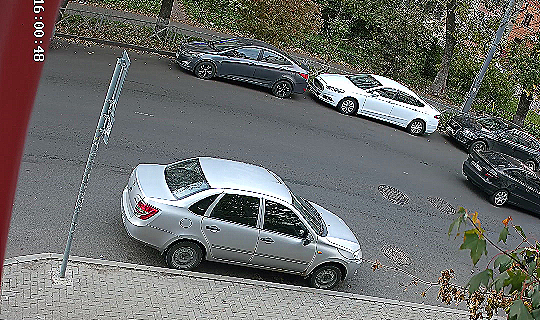

In [16]:
#8
sharpkernel = np.array([[0,-1, 0],[-1, 5, -1],[0, -1, 0]],np.float32)
shrp = cv2.filter2D(frame4,-1,sharpkernel)
Image.fromarray(shrp) 

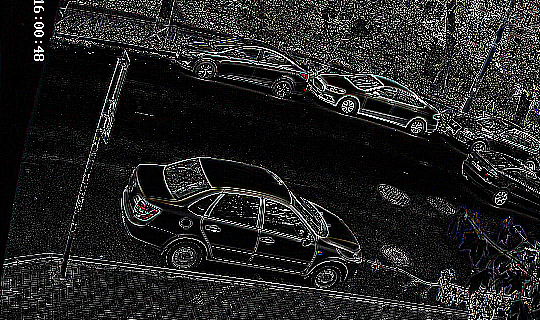

In [17]:
#9
edgekernel = np.array([[-1,-1, -1],[-1, 8, -1],[-1, -1, -1]],np.float32)
edge = cv2.filter2D(frame4,-1,edgekernel)
Image.fromarray(edge) 

Упражнение: сравните среднюю интенсивность красного канала в изображении до фильтрации и после применения каждого из фильтров.

Упражнение: напишите свою функцию свертки с ядром 3х3 и примените ее только к одному каналу изображения.